# Dimensionality Reduction

There are many techniques to decompose features into a smaller subset. This can be useful for explanatory data analysis, visualization, making predictive models, or clustering. 

In [1]:
import pandas as pd 

X = pd.read_excel('X.xls')
y = pd.read_excel('y.xls')

C:\Users\alber\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\alber\anaconda3\lib\site-packages\numpy\.libs\libopenblas.GK7GX5KEQ4F6UYO3P26ULGBQYHGQO7J4.gfortran-win_amd64.dll
C:\Users\alber\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
X.drop(columns = ['Unnamed: 0', 'sex_female', 'embarked_S', 'embarked_Q', 'embarked_C'], inplace = True)

In [3]:
y.drop(columns = 'Unnamed: 0', inplace = True)

## PCA

Principal component analysis (PCA) takes a matrix (X) of rows (samples) and columns (features). PCA returns a new matrix that has columns that are linear combinations of the orginal columns. These linear combinations maximize the variance. 
Each column is orthogonal (a right angle) to the other columns. The columns are sorted in order of decreasing variance. 

It is best to standardize the data prior to tunning the algorithm. After calling the `.fit` method, you will have access to an `.eplained_variance_ratio_` attribute that lists the percentage of variance in each column. 

PCA is useful to visualize data in two (or three) dimensions. It is also used as a preprocessing step to filter out random noise in data. It is good for finding global structures, but not local ones, and works well with linear data. 

In [4]:
from sklearn.decomposition import PCA 
from sklearn.preprocessing import StandardScaler

pca = PCA(random_state=42)
# our data is already standardized 
# x_pca = pca.fit_transform(StandardScaler().fit_transform(X))
x_pca = pca.fit_transform(X)

In [5]:
pca.explained_variance_ratio_

array([0.36115225, 0.31782002, 0.12988516, 0.11873247, 0.07241011])

In [6]:
pca.components_[0]

array([-0.65571574,  0.51412941, -0.12306141, -0.02880901,  0.53826922])

In [7]:
x_pca

array([[-0.78848977, -0.77126841,  0.05639678, -0.12538514,  0.34955108],
       [-0.83577093, -0.75428792,  0.0194475 , -0.16271699,  0.32091094],
       [-0.15244837, -0.38903749, -0.61110595, -0.62392354, -0.4649043 ],
       ...,
       [ 0.44485431, -0.90647421,  0.21258174,  0.32408761, -0.20854947],
       [-0.91591121, -0.73013834, -0.05318444, -0.13260074,  0.34702417],
       [-0.49169249,  0.45291194, -1.20938143, -0.05883267, -0.51674333]])

__Instance parameters__

* `n_components = None` Number of components to generate. If `None`, return same number as number of columns. Can be a float (0,1), then will create as many components as needed to get that ratio of variance. 
* `copy = True` Will mutate data on `.fit` if `True`
* `whiten = False` Whiten data after transform to ensure uncorrelated components. 
* `svd_solver = 'auto'` auto runs, randomized SVD if `n_components` is less than 80% of the smallest dimension ( faster, but an approximation). Otherwise runs full. 
* `tol = 0.0` Tolerance for singular values. 
* `iterated_power = 'auto'` Number of iterations for 'randomized' svd_solver. 
* `random_state = None` Random state for 'randomized' svd_solver.

__Attributes__ 

* `components_` Principal components (columns of linear combination weights for original features) 
* `explained_variance_` Amount of variance for each component
* `explained_variance_ratio` Amount of variance for each component normalized (sums to 1).
* `singular_values_` Singular values for each component. 
* `mean_` Mean of each feature.
* `n_components_` When n_components is a float, this is the size of the components. 
* `noise_variance_` Estimated noise covariance. 


Plotting the comulative sum of the exponential variance ratio is called a _scree plot_. It will show how much information is stored in the components. You cn use the _elbow method_ to see if it bends to determine how many components to use:

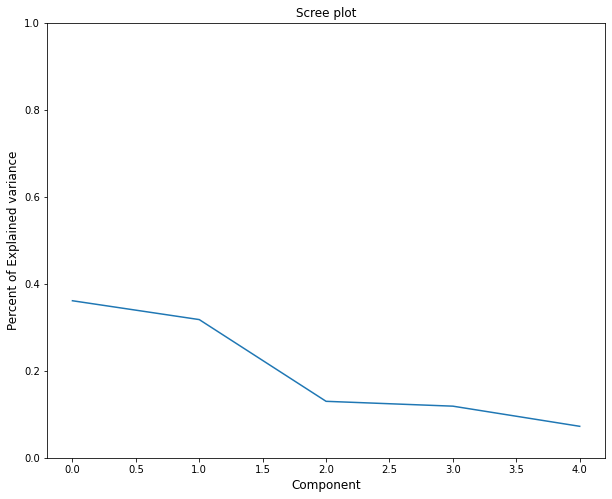

In [8]:
import matplotlib.pyplot as plt 

fig, ax = plt.subplots(figsize = (10,8))
ax.plot(pca.explained_variance_ratio_)
ax.set(xlabel = 'Component', 
      ylabel = 'Percent of Explained variance', 
      title = 'Scree plot', 
      ylim = (0,1))
plt.ylabel('Percent of Explained variance', fontsize = 12)
plt.xlabel('Component', fontsize = 12)
plt.title('Scree plot', fontsize = 12)
plt.show()

Another way to view this data is using a comulative plot. 

Text(0.5, 1.0, 'Cumulative Variance')

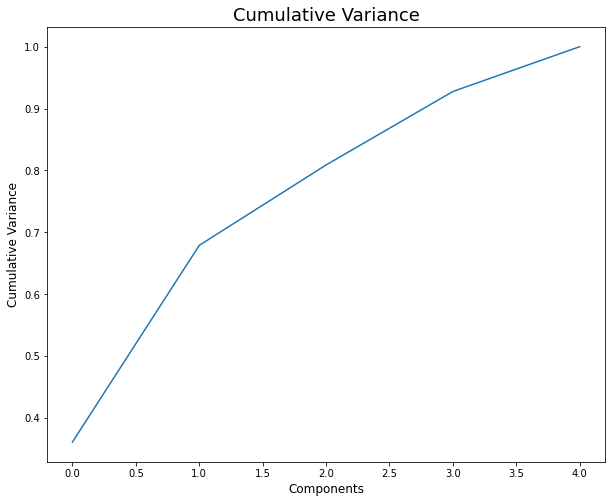

In [9]:
import numpy as np 

fig,ax = plt.subplots(figsize = (10,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Components', fontsize = 12) 
plt.ylabel('Cumulative Variance', fontsize = 12) 
plt.title('Cumulative Variance', fontsize = 18) 

How much do features impact components? 

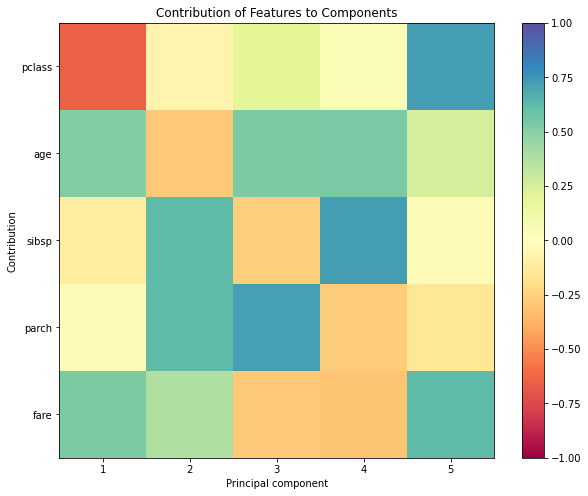

In [10]:
fig,ax = plt.subplots(figsize = (10,8))
plt.imshow(
            pca.components_.T, 
            cmap = 'Spectral', 
            vmin = -1,
            vmax = 1)
plt.yticks(range(len(X.columns)), X.columns)
plt.xticks(range(5), range(1,6))
plt.xlabel('Principal component')
plt.ylabel('Contribution')
plt.title('Contribution of Features to Components')
plt.colorbar()

An alternative view is to look at a bar plot.


Each component is shown with the contributions from the original data: 

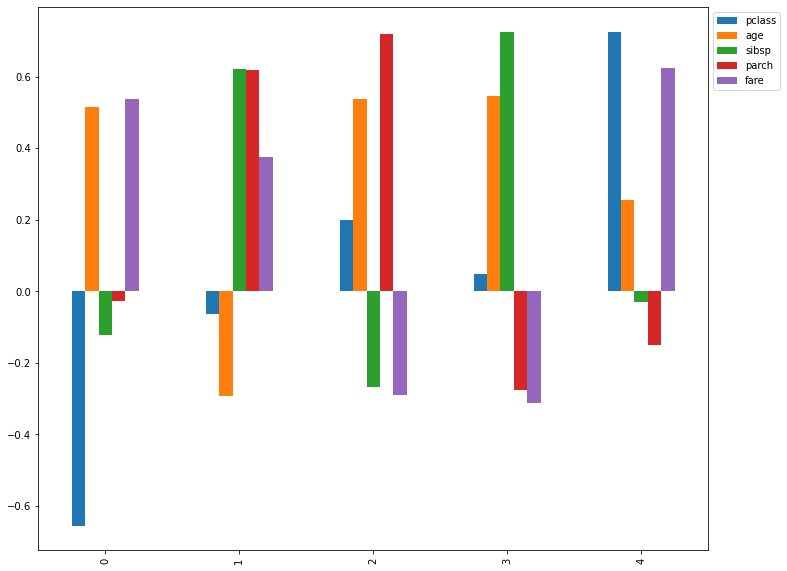

In [11]:
fig,ax = plt.subplots(figsize = (12,10))
pd.DataFrame( 
pca.components_, columns=X.columns).plot(kind = 'bar', ax = ax).legend(bbox_to_anchor = (1,1))
plt.show()

If we have many features, we may want to limit the plots above by showing only features that meet a miinimum weight. Here is code to find all the features in the first two components that have absolute values of at least .5:

In [12]:
comps = pd.DataFrame(pca.components_, columns = X.columns)
min_val = 0.5 
num_components = 2 
pca_cols = set()
for i in range(num_components): 
    parts = comps.iloc[i][
        comps.iloc[i].abs() > min_val
    ]
    pca_cols.update(set(parts.index))
pca_cols

{'age', 'fare', 'parch', 'pclass', 'sibsp'}

PCA is commonly used to visualize high dimensional datasets in two components. Here we visualize the Titanic features in 2D. 
They are colored by their surivival status. Sometimes clusters may appear to be clustering of survivors. 


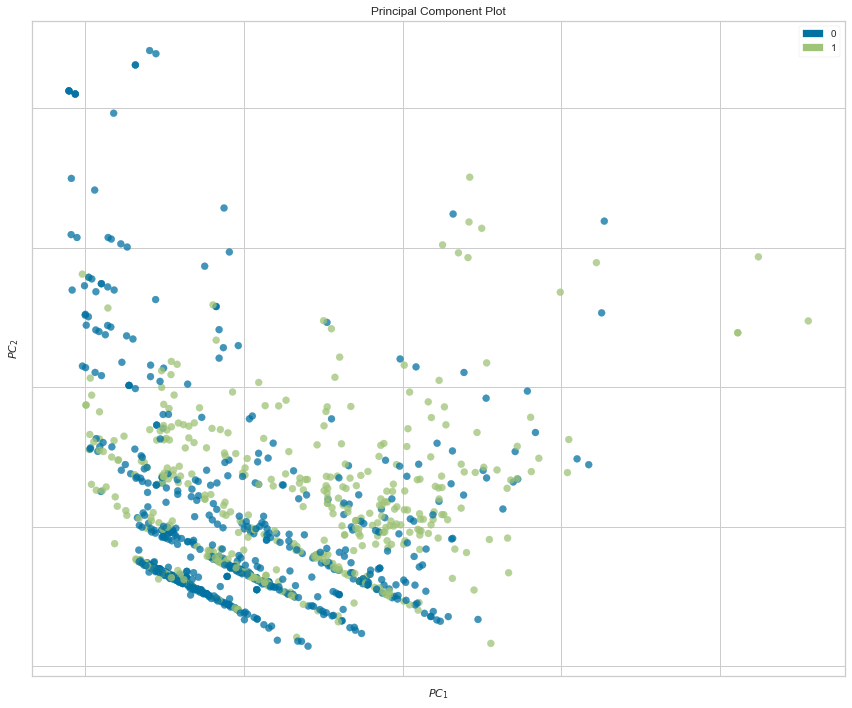

In [13]:
from yellowbrick.features.pca import PCADecomposition

fig,ax = plt.subplots(figsize = (12,10))
colors = ['rg'[j] for j in range(len(y.survived.unique()))]
pca_viz = PCADecomposition(color = colors)
pca_viz.fit_transform(X, y.survived)
pca_viz.poof()
plt.show()

If you want to color the scatter plot by a column and add a legend (not a color bar), you need to loop over each color and plot that group individually in pandas or matplotlib. 


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

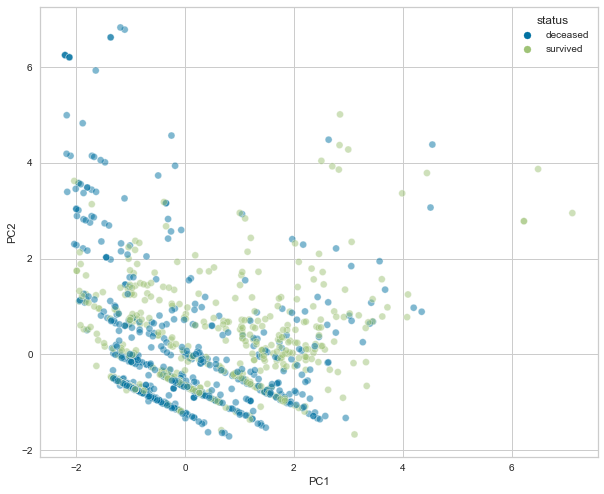

In [15]:
import seaborn

fig, ax = plt.subplots(figsize = (10,10))
pca_df = pd.DataFrame(x_pca, columns =[
    f'PC{i+1}' for i in range(x_pca.shape[1])
])
pca_df['status'] = [
    ('deceased', 'survived')[i] for i in y.survived
]

evr = pca.explained_variance_ratio_
ax.set_aspect(evr[1]/evr[0])
seaborn.scatterplot(
x = 'PC1', 
y = 'PC2', 
hue = 'status', 
data = pca_df,
alpha = 0.5, ax = ax)



Below, we augment the scatter plot by showing a _loading plot_ on top of it. This plot is called a biplot because it has the scatter plot and the loading. The loadings indicate how strong features are and how they correlate. If their angles are closed, they likely correlate. If the angles are at 90 degrees they likely do not correlate. Finally, if the angle between them is close to 180 they have negative correlation:

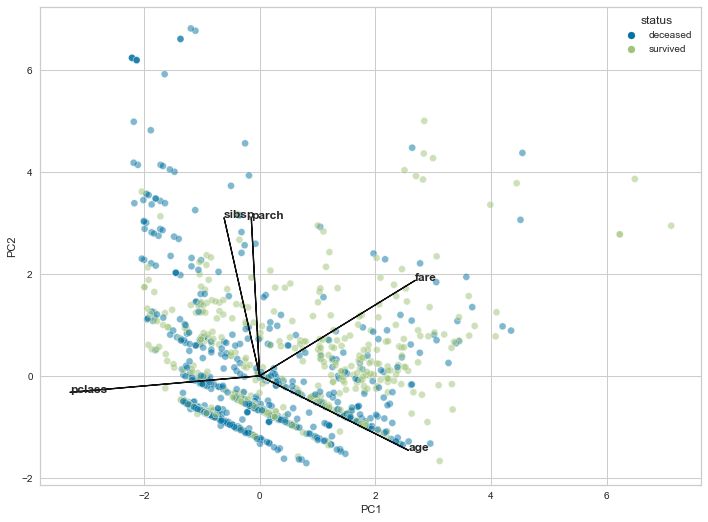

In [21]:
fig,ax = plt.subplots(figsize = (10,10))
x_idx = 0 # x_pc
y_idx = 1 #y_pc
ax.set_aspect(evr[y_idx]/evr[x_idx])
xcol = pca_df.columns[x_idx]
ycol = pca_df.columns[y_idx]

seaborn.scatterplot(
x = xcol,
y = ycol, 
hue = 'status', 
data = pca_df, 
alpha = 0.5, ax = ax)

scale = 5 
comps = pd.DataFrame(pca.components_, columns=X.columns)
for idx, s in comps.T.iterrows():
    plt.arrow(0,
             0,
             s[x_idx]*scale,
             s[y_idx]*scale,
             color = 'k',
             linewidth = 1.3)
    plt.text(s[x_idx]*scale, s[y_idx]*scale, idx, weight = 'bold')

plt.tight_layout()

Let's plot components against each other

<AxesSubplot:xlabel='PC1', ylabel='PC4'>

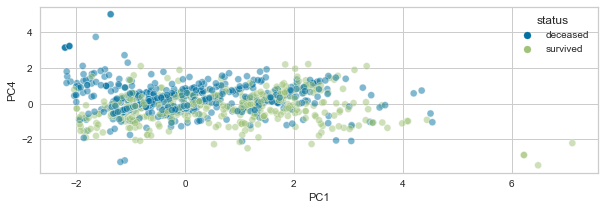

In [22]:
fig, ax = plt.subplots(figsize = (10,10))
ax.set_aspect(evr[3]/evr[0])
seaborn.scatterplot(x = 'PC1', y = 'PC4', hue = 'status', data = pca_df, alpha = 0.5, ax = ax)

In [24]:
from bokeh.io import output_notebook 
from bokeh import models, palettes, transform
from bokeh.plotting import figure, show

In [40]:
def bokeh_scatter(x,y,data,hue=None,label_cols = None, size = None, legend = None, alpha = .5):
    '''
    x - x column name to plot
    y - y column name to plot
    hue- column name to color by (numeric)
    legend- column name to label by 
    label_cols  - columns to use in tooltip (None all in DataFrame)
    size - size of points in scree space unigs 
    alpha - transparency 
    '''
    output_notebook()
    circle_kwargs = {}
    if legend: 
        circle_kwargs['legend'] = legend
    if size:
        circle_kwargs['size'] = size
    if hue:
        color_seq = data[hue]
        mapper = models.LinearColorMapper(palette = palettes.viridis(256),
                                         low = min(color_seq), 
                                         high = max(color_seq))
        circle_kwargs['fill_color'] = transform.transform(hue, mapper)

    ds = models.ColumnDataSource(data)
    if label_cols is None:
        label_cols = data.columns
    
    tool_tips = sorted(
    [
        (x, '@{}'.format(x)) for x in label_cols
    ], key = lambda tup:tup[0])
    
    hoover = models.HoverTool(tooltips = tool_tips)
    
    fig = figure( 
                tools = ['hover', 'pan', 'zoom_in', 'zoom_out', 'reset'])
    fig.circle(x,y,source = ds, alpha = alpha, **circle_kwargs)
    show(fig)
    return fig

In [35]:
data = pca_df.assign(surv = y.reset_index(drop = True))

In [46]:
res = bokeh_scatter('PC1', 'PC2', data =data,  hue = 'surv', size = 10, legend = 'surv')

Loading BokehJS ...

Yellow brick can also plot in three dimensions 

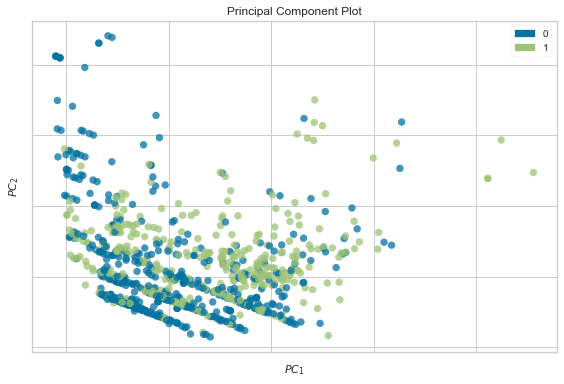

In [59]:
from yellowbrick.features.pca import PCADecomposition


colors = ['rg'[j] for j in range(len(y.survived.unique()))]
pca3_viz = PCADecomposition(proj_dim = 3, color = colors)
pca3_viz.fit_transform(X,y.survived)
pca3_viz.finalize()
fig = plt.gcf()
plt.tight_layout()



In [53]:
import scprep

scprep.plot.rotate_scatter3d(x_pca[:,:3], c = y.survived, cmap = 'Spectral', label_prefix = 'Principal Component')

Text(0.5, 0, 'PC3')

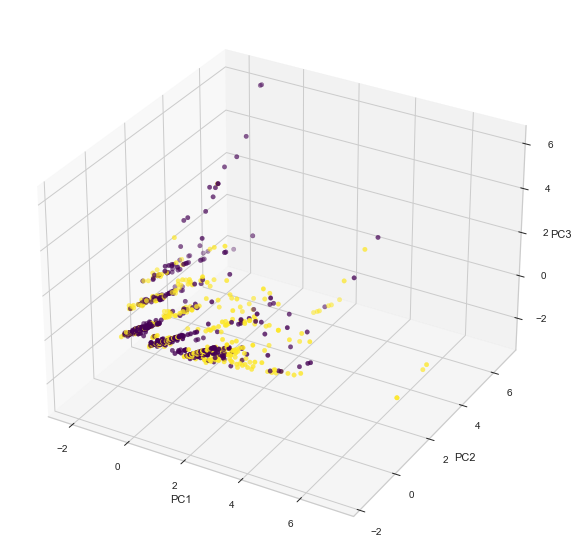

In [57]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(111, projection = '3d')
ax.scatter (xs = x_pca[:,0], 
            ys = x_pca[:,1],
            zs = x_pca[:,2], c = y.survived, cmap = 'viridis')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

For the other dimensionality reduction techniques we move to Colab due to some issues with imports